In [85]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# !unzip '/content/drive/My Drive/data/Unet_train/img_array.zip' -d '/content/drive/My Drive/data/Unet_train/'

Archive:  /content/drive/My Drive/kaggle_data/Unet_train/img_array.zip
  inflating: /content/drive/My Drive/kaggle_data/Unet_train/img_array.npz  


## Importing Lib.

In [ ]:
import numpy as np
from tqdm import tqdm
import random

import cv2
import matplotlib.pyplot as plt
import os

In [ ]:
%cd /content/drive/My Drive/data/Unet_train

/content/drive/My Drive/data/Unet_train


In [ ]:
ls

img_array.npz  img_array.zip  model.png


## Data Loading & Forecasting

In [ ]:
X=np.load('img_array.npz')['X_train']
Y=np.load('img_array.npz')['Y_train']

X.shape, Y.shape

((2000, 224, 224, 3), (2000, 224, 224, 1))

In [ ]:
def show_random():
  f, ax=plt.subplots(4, 6, figsize=(44,30))
  len_= X.shape[0]-1
  for i in tqdm(range(0,6)):
    num=random.randint(0, len_)
    num2=random.randint(0, len_)
    ax[0][i%6].imshow(X[num], aspect='auto'); ax[1][i%6].imshow(Y[num,:,:,0], aspect='auto', cmap='gray')
    ax[2][i%6].imshow(X[num2], aspect='auto'); ax[3][i%6].imshow(Y[num2,:,:,0], aspect='auto', cmap='gray')
  plt.show()

100%|██████████| 6/6 [00:00<00:00, 237.46it/s]


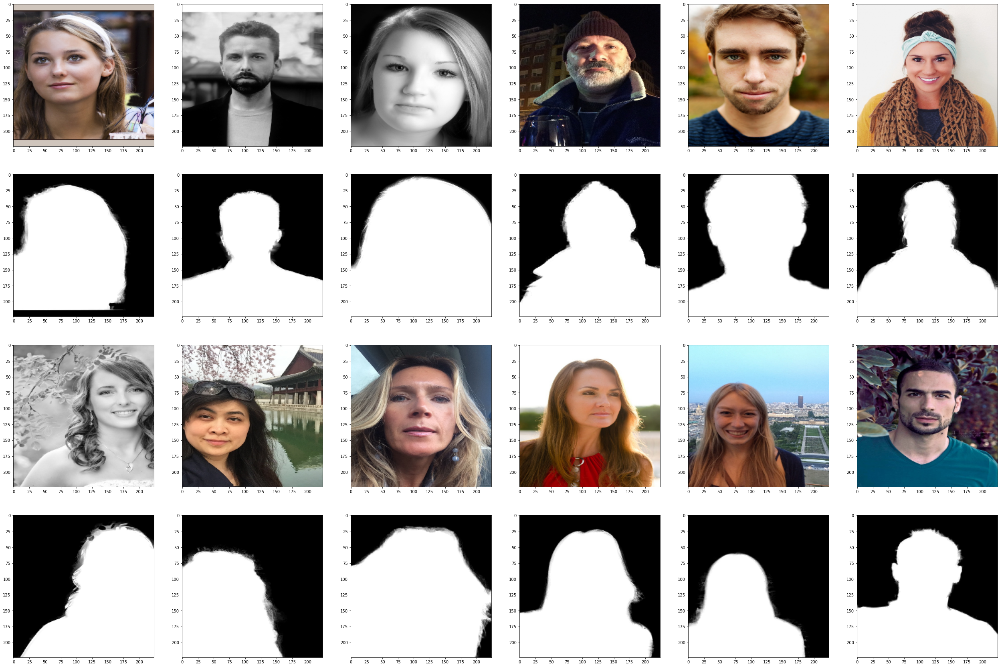

In [ ]:
show_random()

In [ ]:
xtrain=X[:-200]
ytrain=Y[:-200]
xtest=X[-200:]
ytest=Y[-200:]

## Unet architecture
![alt text](https://raw.githubusercontent.com/shreyaspadhy/UNet-Zoo/master/unet.png)

In [ ]:
import tensorflow.keras as keras
from tensorflow.keras import Input
from tensorflow.keras.layers import Conv2D, Dropout, MaxPooling2D, Conv2DTranspose, concatenate, SeparableConv2D

In [ ]:
def unet_model(input_size = (224,224,3)):
    inp= Input(input_size)
    #inp= keras.layers.Lambda(lambda x: x/255)(inp)
    
    #Contraction path
    conv_d0= Conv2D(32, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(inp)
    conv_d0= Dropout(0.4)(conv_d0)
    conv_d0= SeparableConv2D(32, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_d0)
    pool_d0=MaxPooling2D()(conv_d0)

    conv_d1= Conv2D(64, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(pool_d0)
    conv_d1= Dropout(0.3)(conv_d1)
    conv_d1= SeparableConv2D(64, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_d1)
    pool_d1=MaxPooling2D()(conv_d1)
    
    conv_d2= SeparableConv2D(128, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(pool_d1)
    conv_d2= Dropout(0.2)(conv_d2)
    conv_d2= SeparableConv2D(128, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_d2)
    pool_d2=MaxPooling2D()(conv_d2)
    
    conv_d3= SeparableConv2D(256, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(pool_d2)
    conv_d3= Dropout(0.3)(conv_d3)
    conv_d3= SeparableConv2D(256, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_d3)
    pool_d3=MaxPooling2D()(conv_d3)
    
    conv_d4= SeparableConv2D(512, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(pool_d3)
    conv_d4= Dropout(0.2)(conv_d4)
    conv_d4= SeparableConv2D(512, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_d4)
    pool_d4=MaxPooling2D()(conv_d4)
    
    conv_d5= SeparableConv2D(1024, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(pool_d4)
    conv_d5= Dropout(0.3)(conv_d5)
    conv_d5= SeparableConv2D(1024, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_d5)
    
    
    
    #Expansive path 
    conv_u4= Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(conv_d5)
    conv_u4= concatenate([conv_u4,conv_d4])
    conv_u4= Conv2D(512, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_u4)
    conv_u4= Dropout(0.2)(conv_u4)
    conv_u4= Conv2D(512, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_u4)
    
    conv_u3= Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv_u4)
    conv_u3= concatenate([conv_u3,conv_d3])
    conv_u3= Conv2D(256, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_u3)
    conv_u3= Dropout(0.4)(conv_u3)
    conv_u3= Conv2D(256, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_u3)
    
    conv_u2= Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv_u3)
    conv_u2= concatenate([conv_u2,conv_d2])
    conv_u2= Conv2D(128, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_u2)
    conv_u2= Dropout(0.3)(conv_u2)
    conv_u2= Conv2D(128, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_u2)
    
    conv_u1= Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv_u2)
    conv_u1= concatenate([conv_u1,conv_d1])
    conv_u1= Conv2D(64, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_u1)
    conv_u1= Dropout(0.3)(conv_u1)
    conv_u1= Conv2D(64, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_u1)

    conv_u0= Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv_u1)
    conv_u0= concatenate([conv_u0,conv_d0])
    conv_u0= Conv2D(32, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_u0)
    conv_u0= Dropout(0.3)(conv_u0)
    conv_u0= Conv2D(32, (3,3), activation='relu', padding='same', kernel_initializer='he_normal')(conv_u0)
    
    out=Conv2D(1, (1,1), activation='sigmoid')(conv_u0)
    
    return keras.Model(inputs=inp, outputs=out)
    
    

In [ ]:
model=unet_model()
model.summary()

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_20 (Conv2D)              (None, 224, 224, 32) 896         input_3[0][0]                    
__________________________________________________________________________________________________
dropout_19 (Dropout)            (None, 224, 224, 32) 0           conv2d_20[0][0]                  
__________________________________________________________________________________________________
separable_conv2d_19 (SeparableC (None, 224, 224, 32) 1344        dropout_19[0][0]                 
_______________________________________________________________________________________

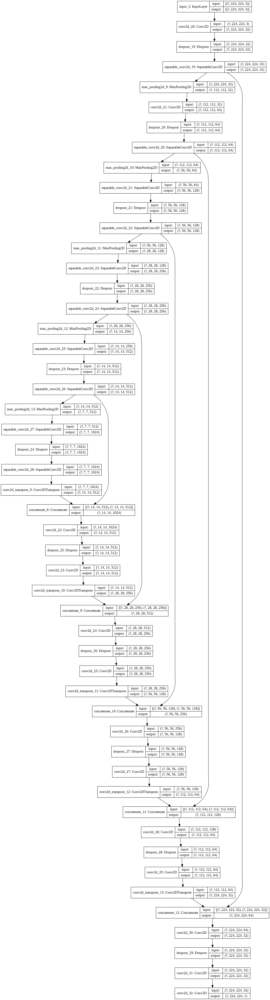

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

In [ ]:
model.compile(loss= keras.losses.binary_crossentropy, optimizer=keras.optimizers.Adam(0.0008), metrics=['accuracy'])

In [ ]:
# CALLBACKS
check_point=keras.callbacks.ModelCheckpoint(
    filepath='model_unet_1.h5', monitor='val_loss', verbose=1, save_best_only=True,
    save_weights_only=True, mode='min')

stop= keras.callbacks.EarlyStopping(
    monitor='val_loss', min_delta=0, patience=5, verbose=0, mode='min',
    baseline=None, restore_best_weights=False)

In [20]:
history=model.fit(xtrain, ytrain , epochs=80, validation_data= (xtest, ytest),
                  batch_size=20, callbacks=[check_point, stop], validation_batch_size=30)

Epoch 1/80
90/90 [==============================] - ETA: 0s - loss: 0.5121 - accuracy: 0.7070
Epoch 00001: val_loss improved from inf to 0.40033, saving model to model_unet_1.h5
90/90 [==============================] - 79s 878ms/step - loss: 0.5121 - accuracy: 0.7070 - val_loss: 0.4003 - val_accuracy: 0.7717
Epoch 2/80
90/90 [==============================] - ETA: 0s - loss: 0.3740 - accuracy: 0.7913
Epoch 00002: val_loss improved from 0.40033 to 0.38109, saving model to model_unet_1.h5
90/90 [==============================] - 76s 847ms/step - loss: 0.3740 - accuracy: 0.7913 - val_loss: 0.3811 - val_accuracy: 0.7770
Epoch 3/80
90/90 [==============================] - ETA: 0s - loss: 0.3537 - accuracy: 0.7990
Epoch 00003: val_loss improved from 0.38109 to 0.37868, saving model to model_unet_1.h5
90/90 [==============================] - 75s 831ms/step - loss: 0.3537 - accuracy: 0.7990 - val_loss: 0.3787 - val_accuracy: 0.7834
Epoch 4/80
90/90 [==============================] - ETA: 0s - 

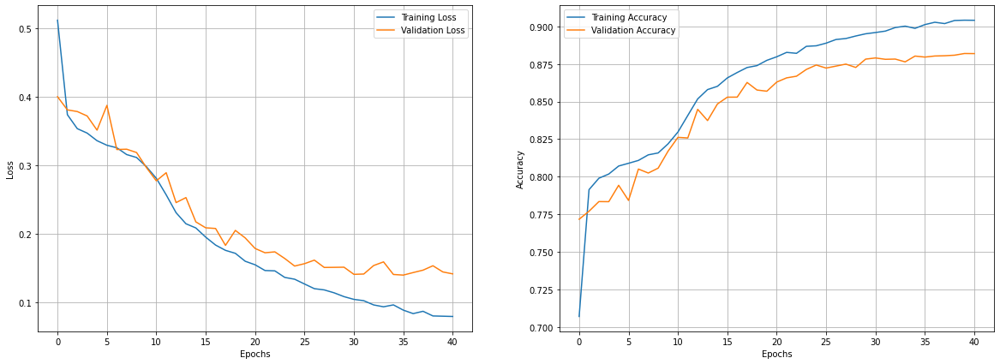

In [23]:
plt.figure(1, figsize = (20, 7))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.plot( history.history["loss"], label = "Training Loss")
plt.plot( history.history["val_loss"], label = "Validation Loss")
plt.grid(True)
plt.legend()

plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.plot( history.history["accuracy"], label = "Training Accuracy")
plt.plot( history.history["val_accuracy"], label = "Validation Accuracy")
plt.grid(True)
plt.legend()

## Testing model

In [28]:
model.evaluate(xtest, ytest)

7/7 [==============================] - 3s 425ms/step - loss: 0.1398 - accuracy: 0.8796


[0.1397741138935089, 0.8795585632324219]

In [27]:
model.load_weights('/content/drive/My Drive/data/Unet_train/model_unet_1.h5')

In [84]:
def pred(num, confidance=0.6):
  f, ax= plt.subplots(1, 2 , figsize=(16,6))
  x=X[num]
  y=model.predict(X[num].reshape((1, 224, 224, 3)))
  y=np.float32((y>0.5))
  ax[0].imshow(x)
  ax[1].imshow(y.reshape((224,224)))
  plt.show()


model.predict(X[num].reshape((1, 224, 224, 3)))

NameError: ignored

In [ ]:
pred(10, 0.8)

In [ ]:
pred(-100, 0.8)

In [63]:
def show_test(confidance=0.7):
  f, ax=plt.subplots(4, 6, figsize=(44,30))
  len_= X.shape[0]-1
  for i in tqdm(range(0,6)):
    num=random.randint(0, len_)
    num2=random.randint(0, len_)
    ax[0][i%6].imshow(X[num], aspect='auto') 
    y1= model.predict(X[num].reshape((1, 224, 224, 3)))
    y1= np.float32((y1 > confidance))       #confidance level tuning
    y1= y1.reshape((224,224))
    ax[1][i%6].imshow(y1, aspect='auto', cmap='gray')


    ax[2][i%6].imshow(X[num2], aspect='auto')
    y2= model.predict(X[num2].reshape((1, 224, 224, 3)))
    y2= np.float32((y2 > confidance))       #confidance level tuning
    y2= y2.reshape((224,224))
    ax[3][i%6].imshow(y2, aspect='auto', cmap='gray')
  plt.show()

100%|██████████| 6/6 [00:00<00:00,  7.09it/s]


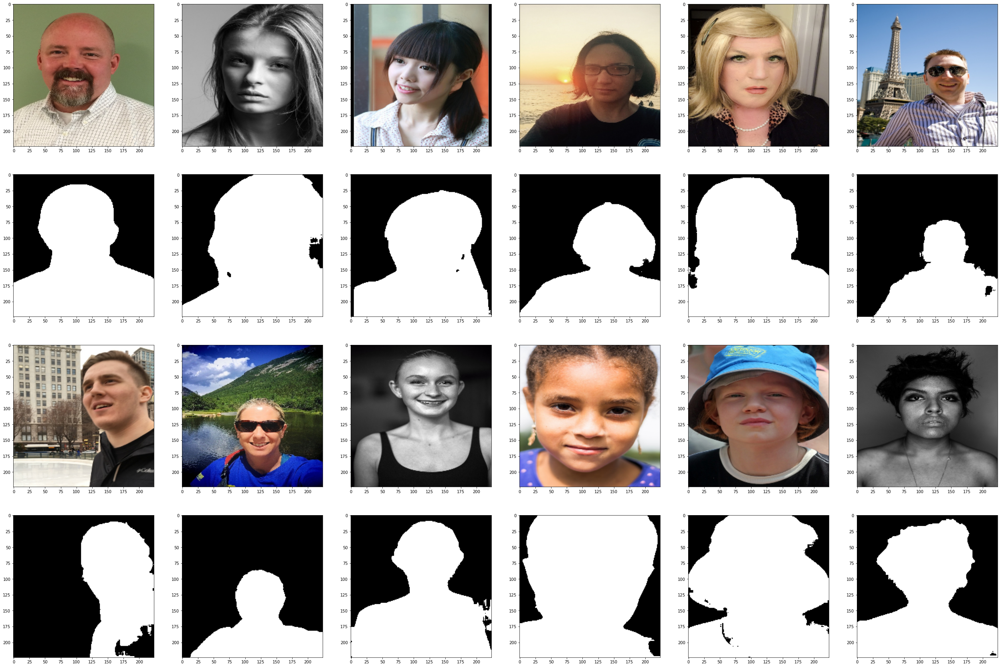

In [68]:
show_test()

100%|██████████| 6/6 [00:00<00:00,  7.35it/s]


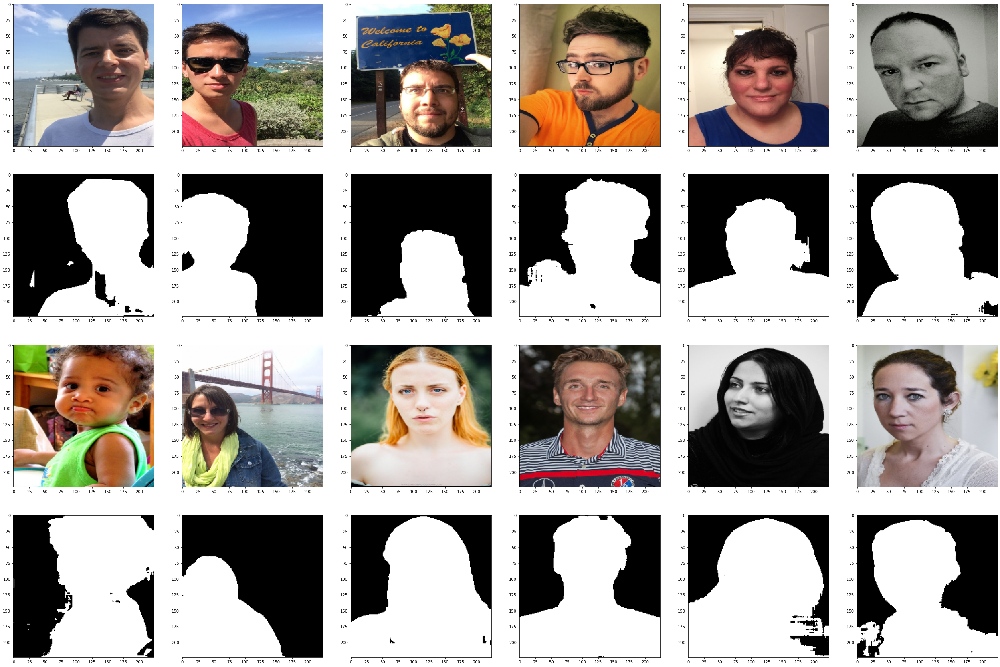

In [69]:
show_test()

In [78]:
def show_test_mask(confidance=0.7):
  f, ax=plt.subplots(4, 6, figsize=(44,30))
  len_= X.shape[0]-1
  for i in tqdm(range(0,6)):
    num=random.randint(0, len_)
    num2=random.randint(0, len_)
    ax[0][i%6].imshow(X[num], aspect='auto') 
    y1= model.predict(X[num].reshape((1, 224, 224, 3)))
    y1= np.float32((y1 > confidance))       #confidance level tuning
    y1=X[num]*y1
    ax[1][i%6].imshow(y1[0], aspect='auto', cmap='gray')


    ax[2][i%6].imshow(X[num2], aspect='auto')
    y2= model.predict(X[num2].reshape((1, 224, 224, 3)))
    y2= np.float32((y2 > confidance))       #confidance level tuning
    y2= X[num2]*y2
    ax[3][i%6].imshow(y2[0], aspect='auto', cmap='gray')
  plt.show()

100%|██████████| 6/6 [00:01<00:00,  5.71it/s]


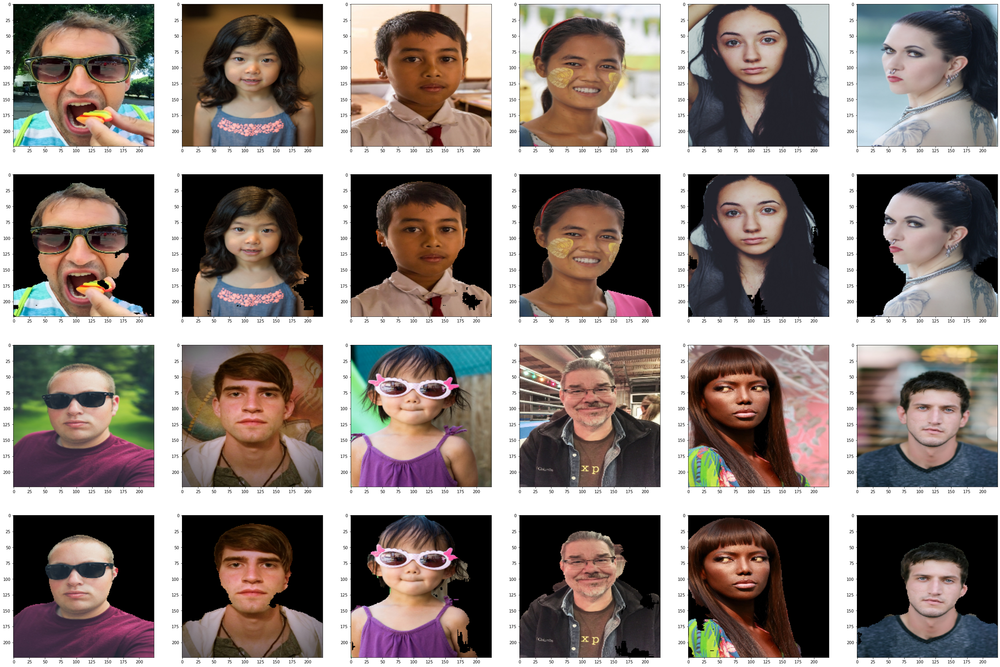

In [81]:
show_test_mask(0.8)

In [82]:
show_test_mask

<function __main__.show_test_mask>

100%|██████████| 6/6 [00:00<00:00,  6.83it/s]


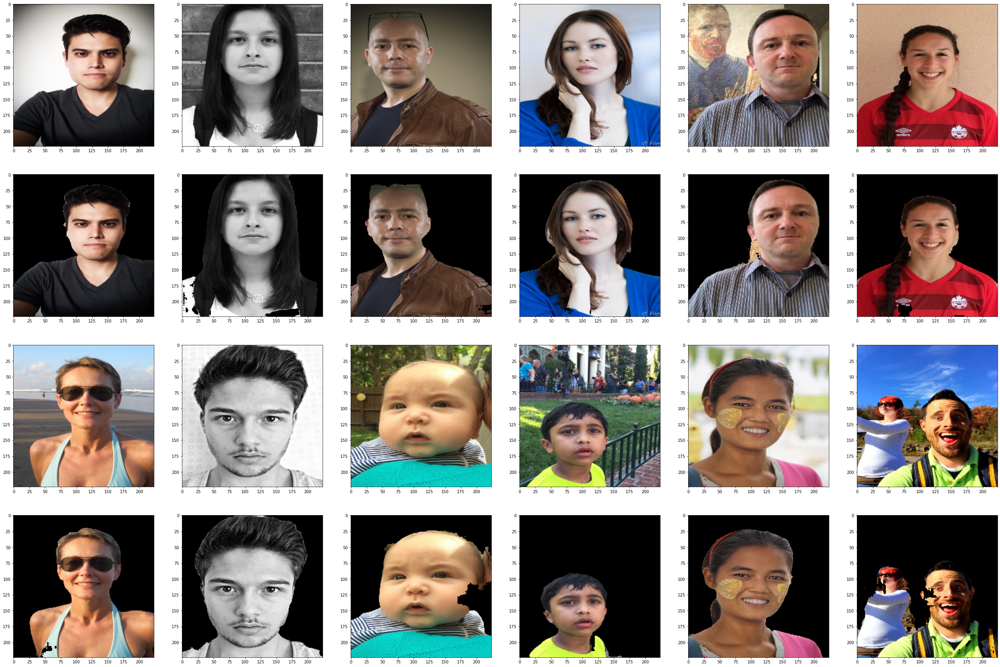

In [83]:
show_test_mask()